# ***Video Game Sales Analysis***

"*In this exploratory data analysis of a video game dataset, we will compare and contrast the visualization capabilities of **matplotlib.pyplot** and **plotly.graph_objs** libraries based on factors such as ease of use, customization options, interactive features, and ability to handle large datasets.*"

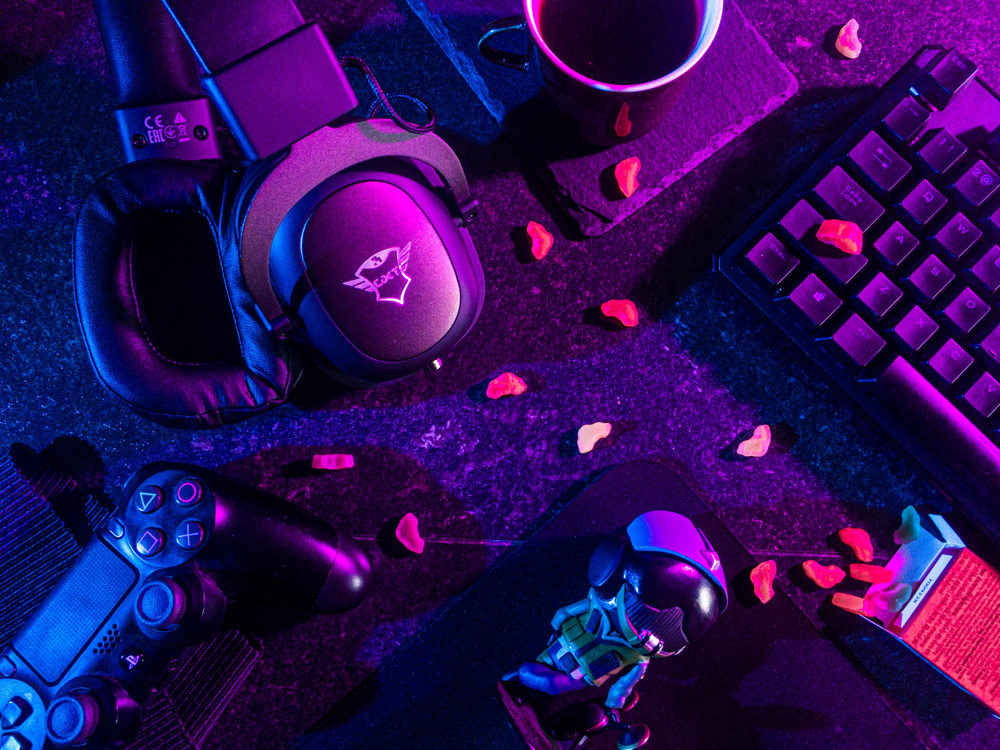

In [47]:
from PIL import Image
img = Image.open("Game.jpg")
img

# ***Installing Libraries***

In [1]:
pip install chart-studio

Note: you may need to restart the kernel to use updated packages.


# ***Importing the required libraries***

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=False)
import seaborn as sns

# ***Load the dataset into pandas dataframe***

In [3]:
df=pd.read_csv('vgsales.csv')
df.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


*The original DataFrame is copied to create a new DataFrame named "df_copy", which is used for making changes without affecting the original data. By creating a copy, any changes made to "df_copy" will not modify the original DataFrame, ensuring that the original data is preserved. This practice helps to maintain the integrity and consistency of the original data during the data cleaning process.*

In [4]:
df_copy=df.copy()

In [5]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


In [6]:
df_copy.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16598.000000,16327.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000
mean,8300.605254,2006.406443,0.264667,0.146652,0.077782,0.048063,0.537441
std,4791.853933,5.828981,0.816683,0.505351,0.309291,0.188588,1.555028
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4151.250000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8300.500000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12449.750000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.470000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


# ***Data Cleaning***
* **Handling missing values:** *filling in or dropping missing data points in a dataset.*
* **Removing duplicates:** *removing duplicate records from a dataset to avoid double-counting.*
* **Correcting data format:** *transforming data to match the expected format for analysis or to meet certain data standards.*
* **Handling outliers:** *removing or correcting extreme data points that may skew analysis results.*
* **Normalizing data:** *transforming data to have a common scale, enabling easier comparison between different datasets.*
* **Handling inconsistent data:** *identifying and resolving discrepancies in data that arise due to inconsistencies in measurement or data entry.*
* **Checking for data integrity:** *verifying that data is accurate and complete, and identifying any potential errors or anomalies.*

In [7]:
df_copy.isna().sum()

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64

In [8]:
df_copy["Year"].fillna(df_copy["Year"].median(),inplace = True)
df_copy.dropna(subset=['Publisher'],inplace=True)
df_copy.isna().sum()

Rank            0
Name            0
Platform        0
Year            0
Genre           0
Publisher       0
NA_Sales        0
EU_Sales        0
JP_Sales        0
Other_Sales     0
Global_Sales    0
dtype: int64

In [9]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16540 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16540 non-null  int64  
 1   Name          16540 non-null  object 
 2   Platform      16540 non-null  object 
 3   Year          16540 non-null  float64
 4   Genre         16540 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16540 non-null  float64
 7   EU_Sales      16540 non-null  float64
 8   JP_Sales      16540 non-null  float64
 9   Other_Sales   16540 non-null  float64
 10  Global_Sales  16540 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.5+ MB


**"*It's advisable to check the datatype of each column and convert them back to their original datatypes if necessary.*"**

In [10]:
df_copy['Year'] = pd.to_datetime(df_copy['Year'],format='%Y')
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16540 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Rank          16540 non-null  int64         
 1   Name          16540 non-null  object        
 2   Platform      16540 non-null  object        
 3   Year          16540 non-null  datetime64[ns]
 4   Genre         16540 non-null  object        
 5   Publisher     16540 non-null  object        
 6   NA_Sales      16540 non-null  float64       
 7   EU_Sales      16540 non-null  float64       
 8   JP_Sales      16540 non-null  float64       
 9   Other_Sales   16540 non-null  float64       
 10  Global_Sales  16540 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(4)
memory usage: 1.5+ MB


***Drop the unwanted columns where you can modify the list of column names inside the drop() method to match the columns you want to remove from your DataFrame. This practice can help to simplify your DataFrame and make it easier to work with during subsequent analysis.***

In [11]:
df_copy.drop(columns=['Rank'],inplace=True)
df_copy

,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,Wii Sports,Wii,2006-01-01,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,Super Mario Bros.,NES,1985-01-01,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,Mario Kart Wii,Wii,2008-01-01,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,Wii Sports Resort,Wii,2009-01-01,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,Pokemon Red/Pokemon Blue,GB,1996-01-01,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...
16593,Woody Woodpecker in Crazy Castle 5,GBA,2002-01-01,Platform,Kemco,0.01,0.00,0.00,0.00,0.01
16594,Men in Black II: Alien Escape,GC,2003-01-01,Shooter,Infogrames,0.01,0.00,0.00,0.00,0.01
16595,SCORE International Baja 1000: The Official Game,PS2,2008-01-01,Racing,Activision,0.00,0.00,0.00,0.00,0.01
16596,Know How 2,DS,2010-01-01,Puzzle,7G//AMES,0.00,0.01,0.00,0.00,0.01


In [12]:
df_copy.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
NA_Sales,16540.0,0.265079,0.817929,0.00,0.00,0.08,0.24,41.49
EU_Sales,16540.0,0.146883,0.506129,0.00,0.00,0.02,0.11,29.02
JP_Sales,16540.0,0.077998,0.309800,0.00,0.00,0.00,0.04,10.22
Other_Sales,16540.0,0.048191,0.188879,0.00,0.00,0.01,0.04,10.57
Global_Sales,16540.0,0.538426,1.557424,0.01,0.06,0.17,0.48,82.74


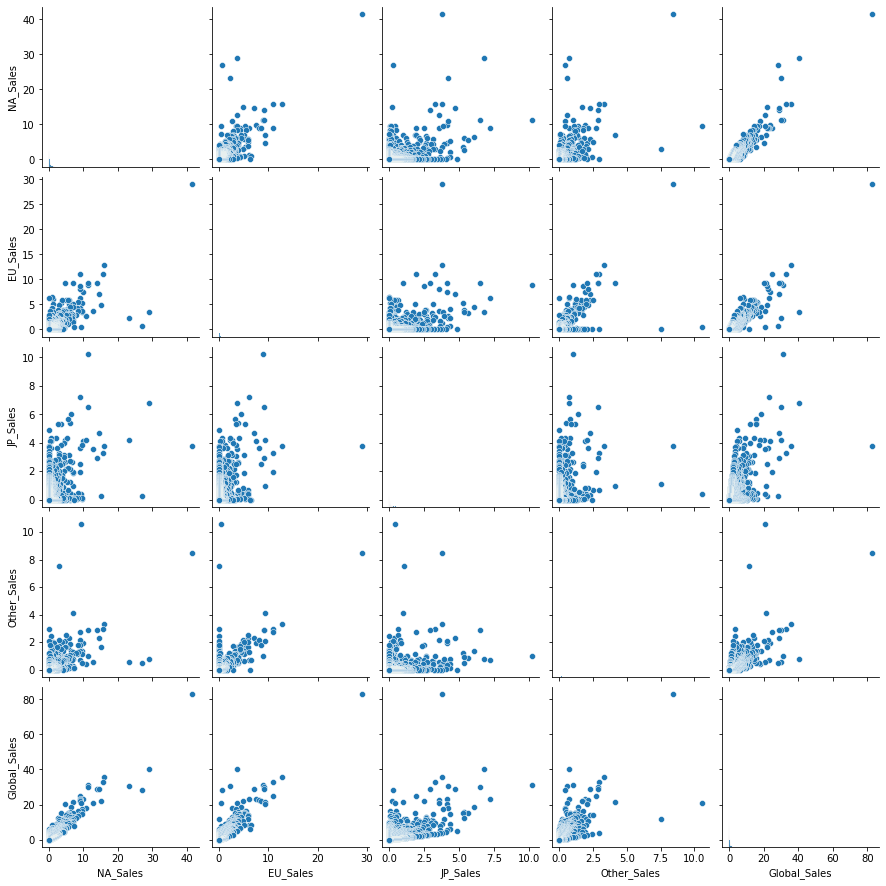

In [13]:
sns.pairplot(df_copy)
plt.show()

# **Exploring the relationship between Year and Global Sales**

From the following scatterplot, we can see that most game titles made global sales of below roughly $15 million mark, with some exceptionally good ones going beyond that. We even notice some outliers, with one game in particular released in 2006 making a breakthrough


***Visualization using plotly.graph_objs***

In [14]:
# Create the traces
trace1 = go.Scatter(x=df_copy['Year'], y=df_copy['Global_Sales'], mode='markers')

# Combine the traces into a data list
data = [trace1]

# Set the layout
layout = go.Layout(title='Relation between Global Sales Vs Year', xaxis=dict(title='Year'),
                   yaxis=dict(title='Global Sales'), bargap=0.7,autosize=False)

# Create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# Display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

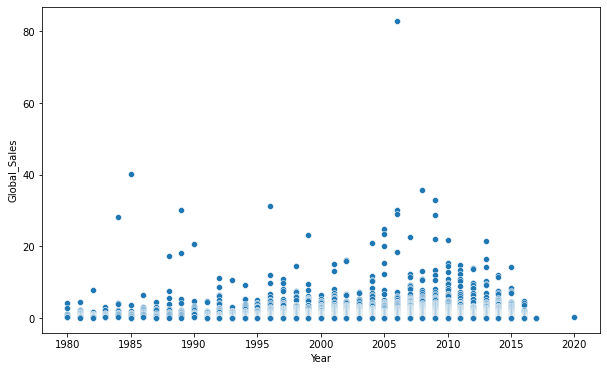

In [16]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df_copy,x="Year",y="Global_Sales")
plt.show()

# ***1. Which region has performed the best in terms of sales?***

In [17]:
def max_sales_region(df): # To find the max sales by each region 
    sales_data = {'Global' : df['Global_Sales'],
                  'North America': df['NA_Sales'],
                  'Europe': df['EU_Sales'],
                  'Japan': df['JP_Sales'],
                  'Other Regions': df['Other_Sales']}
    
    # Initialize an empty list to store the max sales for each region
    max_sales = []
    
    # Loop over the regions
    for region_name, region_sales in sales_data.items():
        
        # Calculate the max sales for the region
        max_sales_by_region = region_sales.max()
        
        # Print the max sales for the region
        print(f"The max sales in {region_name} = ${max_sales_by_region}")
        
        # Add the max sales to the list
        max_sales.append(max_sales_by_region)
    
    # Determine the region with the highest sales
    best_region = max_sales.index(max(max_sales))
    
    # Print the result
    print(f'The region {list(sales_data.keys())[best_region]} with a max sales of ${max(max_sales)}')


In [17]:
max_sales_region(df_copy)

The max sales in Global = $82.74
The max sales in North America = $41.49
The max sales in Europe = $29.02
The max sales in Japan = $10.22
The max sales in Other Regions = $10.57
The region Global with a max sales of $82.74


In [18]:
def best_sales_region(df): # function to find the region with better avg sales
    # Create a dictionary of the sales data for each region
    sales_data = {'North America': df['NA_Sales'],
                  'Europe': df['EU_Sales'],
                  'Japan': df['JP_Sales'],
                  'Other Regions': df['Other_Sales']}
    
    # Initialize an empty list to store the mean sales for each region
    mean_sales = []
    
    # Loop over the regions
    for region_name, region_sales in sales_data.items():
        
        # Calculate the mean sales for the region
        mean = round(region_sales.mean()* 100000)
        
        # Print the mean sales for the region
        print(f"The average sales in {region_name} = ${mean}")
        
        # Add the mean sales to the list
        mean_sales.append(mean)
    
    # Determine the region with the highest sales
    best_region = mean_sales.index(max(mean_sales))
    
    # Print the result
    print(f'The best performed sales region is {list(sales_data)[best_region]} with a sales of ${max(mean_sales)}')

In [19]:
best_sales_region(df_copy)

The average sales in North America = $26508
The average sales in Europe = $14688
The average sales in Japan = $7800
The average sales in Other Regions = $4819
The best performed sales region is North America with a sales of $26508


# ***Bar chart for the best performed sales region***

***Visualization using plotly.graph_objs***

In [20]:
# Create the traces
trace1 = go.Bar(x=['Global','North America', 'Europe', 'Japan',
       'Other'], y=[537440,264667, 146652, 77781, 48063],marker=dict(color=['red', 'blue', 'green', 'orange', 'purple']),
        opacity=0.7)
# Set the layout
layout = go.Layout(title='Highest sales by region', xaxis=dict(title='Region'),
                   yaxis=dict(title='Sales'), bargap=0.7,autosize=False)

# Combine the traces into a data list
data = [trace1]


# Create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# Display the plot in the notebook
iplot(fig)

In [21]:
trace1 = go.Scatter(x=['Global','North America', 'Europe', 'Japan',
       'Other'], y=[537440,264667, 146652, 77781, 48063], mode='markers',
       marker=dict(size=[30,20,15,10,5], color=['red', 'blue', 'green', 'orange', 'purple']))
layout = go.Layout(title='Highest sales by region', xaxis=dict(title='Region'),
                   yaxis=dict(title='Sales'), autosize=False)
data = [trace1]
# Create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# Display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

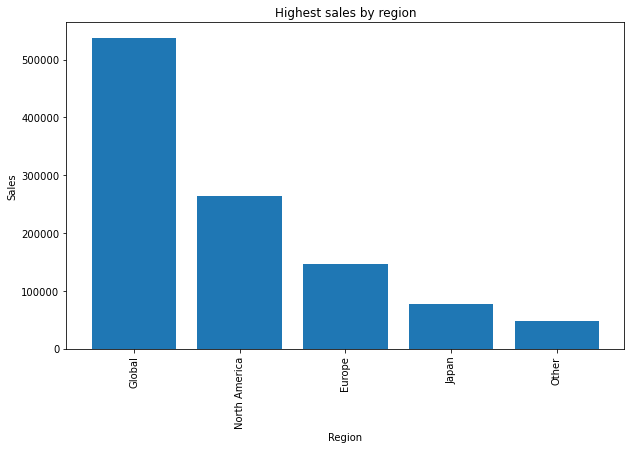

In [22]:
# create a bar chart using the top_publisher DataFrame
plt.figure(figsize=(10,6))
plt.bar(['Global','North America', 'Europe', 'Japan',
       'Other'], [537440,264667, 146652, 77781, 48063])

# set the axis labels and title
plt.xlabel('Region')
plt.ylabel('Sales')
plt.title('Highest sales by region')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# show the plot
plt.show()

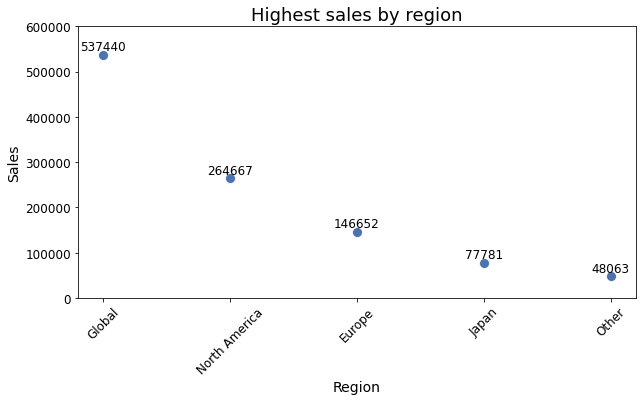

In [23]:
# increase the figure size
plt.figure(figsize=(10,5))

# create the scatter plot
sns.scatterplot(x=['Global','North America', 'Europe', 'Japan', 'Other'], 
                y=[537440,264667, 146652, 77781, 48063], 
                s=100, color='#4C72B0')

# set the axis labels and title
plt.xlabel('Region', fontsize=14)
plt.ylabel('Sales', fontsize=14)
plt.title('Highest sales by region', fontsize=18)

# rotate the x-axis labels for better visibility
plt.xticks(rotation=45)

plt.ylim((0,600000))

# increase the font size of the tick labels
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# add text labels to the data points
for i in range(len(['Global','North America', 'Europe', 'Japan', 'Other'])):
    plt.text(i, [537440,264667, 146652, 77781, 48063][i] + 10000, 
             [537440,264667, 146652, 77781, 48063][i], ha='center', fontsize=12)

# ***2.What are the top 5 most popular games platform?***

In [24]:
df_copy['Platform'].value_counts().head(5)

PS2     2159
DS      2156
PS3     1326
Wii     1324
X360    1261
Name: Platform, dtype: int64

***Visualization using plotly.graph_objs***

In [25]:
# create the trace
trace1 = go.Bar(x=df_copy['Platform'].value_counts().index[:5], y=df_copy['Platform'].value_counts()[:5], opacity=1.0,
                marker=dict(color='green'))

# combine the traces into a data list
data = [trace1]

# set the layout
layout = go.Layout(title='Top 5 most popular games platform',
                   xaxis=dict(title='Platform'),
                   yaxis=dict(title='Count'),
                   bargap=0.3,
                  autosize=False)

# create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

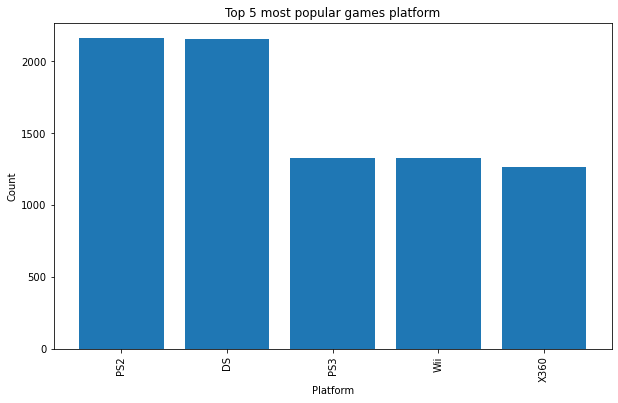

In [26]:
# create a bar chart using the  df_copy['Platform'] pandas series
plt.figure(figsize=(10,6))
plt.bar(df_copy['Platform'].value_counts().index[:5], df_copy['Platform'].value_counts()[:5])

# set the axis labels and title
plt.xlabel('Platform')
plt.ylabel('Count')
plt.title('Top 5 most popular games platform')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# show the plot
plt.show()

# ***3.What is the count of games released by various genre ?***

In [27]:
df_copy.Genre.value_counts()

Action          3309
Sports          2343
Misc            1712
Role-Playing    1486
Shooter         1308
Adventure       1282
Racing          1248
Platform         884
Simulation       863
Fighting         846
Strategy         678
Puzzle           581
Name: Genre, dtype: int64

***Visualization using plotly.graph_objs***

In [28]:
# create the trace
trace = go.Bar(x=df_copy.Genre.value_counts().index, y=df_copy.Genre.value_counts(), opacity=1.0,
               marker=dict(color='green') )

# combine the traces into a data list
data = [trace]

# set the layout
layout = go.Layout(title='Count of Games released by Various Genre',
                   xaxis=dict(title='Genre'),
                   yaxis=dict(title='Count'),
                   bargap=0.3,
                  autosize=False)

# create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

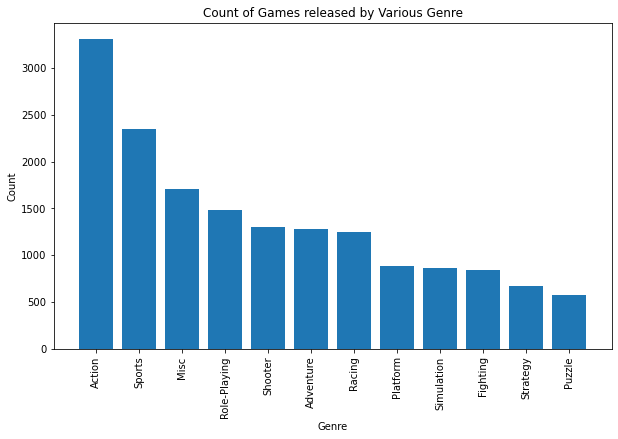

In [29]:
# create a bar chart using the top_publisher DataFrame
plt.figure(figsize=(10,6))
plt.bar(df_copy.Genre.value_counts().index, df_copy.Genre.value_counts())

# set the axis labels and title
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Count of Games released by Various Genre')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# show the plot
plt.show()

***Visualization using plotly.graph_objs***

In [30]:
# create the trace for the pie chart
trace = go.Pie(labels=df_copy.Genre.value_counts().index,
               values=df_copy.Genre.value_counts(),opacity=0.75,
               marker=dict(colors=['green', 'blue', 'red', 'yellow', 'purple'], line=dict( width=0.5)))

# set the layout
layout = go.Layout(title='Count of Games released by Various Genre')

# create a figure object that combines the data and layout
fig = go.Figure(data=[trace], layout=layout)

# display the plot in the notebook
fig.show()

# ***4. Who are the top 5 publishers making the most sales globally?***

In [32]:
df_copy.head()

,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,Wii Sports,Wii,2006-01-01,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,Super Mario Bros.,NES,1985-01-01,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,Mario Kart Wii,Wii,2008-01-01,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,Wii Sports Resort,Wii,2009-01-01,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,Pokemon Red/Pokemon Blue,GB,1996-01-01,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [33]:
top_publisher=pd.DataFrame(df_copy.groupby('Publisher')[['Global_Sales']].sum().sort_values(by=['Global_Sales'],ascending=False))
top_publisher.head()

,Global_Sales
Publisher,
Nintendo,1786.56
Electronic Arts,1110.32
Activision,727.46
Sony Computer Entertainment,607.50
Ubisoft,474.72


***Visualization using plotly.graph_objs***

In [34]:
# create the trace
trace = go.Bar(x=top_publisher.index[:5], y=top_publisher['Global_Sales'].head(), opacity=1.0,
               marker=dict(color='green') )

# combine the traces into a data list
data =[trace]

# set the layout
layout = go.Layout(title='Total Global Sales by Publisher',
                   xaxis=dict(title='Publisher'),
                   yaxis=dict(title='Global Sales'),
                   bargap=0.5,autosize=False)

# create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

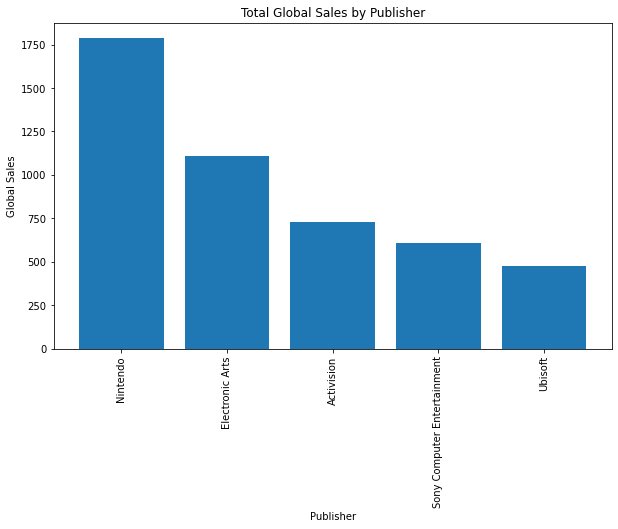

In [35]:
# create a bar chart using the top_publisher DataFrame
plt.figure(figsize=(10,6))
plt.bar(top_publisher.index[:5], top_publisher['Global_Sales'].head())

# set the axis labels and title
plt.xlabel('Publisher')
plt.ylabel('Global Sales')
plt.title('Total Global Sales by Publisher')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# show the plot
plt.show()

# ***5. What are the top 10 games currently making the most sales globally?***

In [36]:
top_games= pd.DataFrame(df_copy.groupby("Name")[["Global_Sales"]].sum().sort_values(by=['Global_Sales'],ascending=[False]))
top_games.head(10) #Printing the top 10 results

,Global_Sales
Name,
Wii Sports,82.74
Grand Theft Auto V,55.92
Super Mario Bros.,45.31
Tetris,35.84
Mario Kart Wii,35.82
Wii Sports Resort,33.00
Pokemon Red/Pokemon Blue,31.37
Call of Duty: Black Ops,31.03
Call of Duty: Modern Warfare 3,30.83


***Visualization using plotly.graph_objs***

In [37]:
# create the trace
trace = go.Bar(x=top_games.index[:10], y=top_games['Global_Sales'].head(10), opacity=1.0,
               marker=dict(color='green') )

# combine the traces into a data list
data =[trace]

# set the layout
layout = go.Layout(title='Total Global Sales by Top Games',
                   xaxis=dict(title='Games'),
                   yaxis=dict(title='Global Sales'),
                   bargap=0.5,autosize=False)

# create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

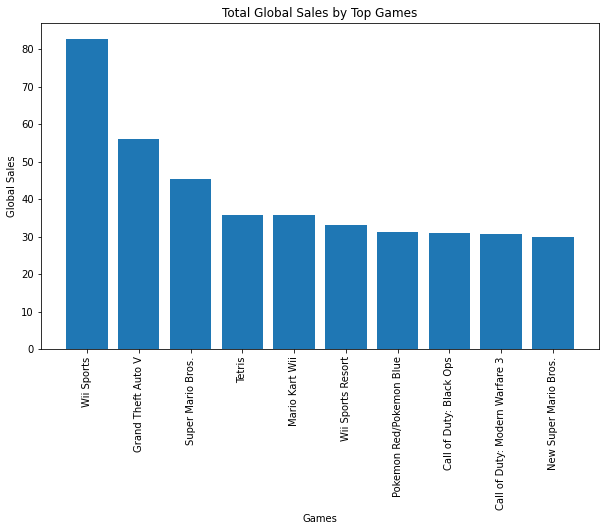

In [38]:
# create a bar chart using the top_publisher DataFrame
plt.figure(figsize=(10,6))
plt.bar(top_games.index[:10], top_games['Global_Sales'].head(10))

# set the axis labels and title
plt.xlabel('Games')
plt.ylabel('Global Sales')
plt.title('Total Global Sales by Top Games')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# show the plot
plt.show()

# ***6. What are the top gaming genres that are making high sales?***

In [39]:
genre_df = df_copy.groupby("Genre")[["Global_Sales"]].sum().sort_values(by=['Global_Sales'],ascending=[False])
genre_df #print the dataframe

,Global_Sales
Genre,
Action,1750.33
Sports,1329.35
Shooter,1037.32
Role-Playing,927.31
Platform,830.87
Misc,802.15
Racing,732.03
Fighting,445.70
Simulation,391.96


***Visualization using plotly.graph_objs***

In [40]:
# create the trace
trace = go.Bar(x=genre_df.index[:10], y=genre_df['Global_Sales'].head(10), opacity=1.0,
               marker=dict(color='green') )

# combine the traces into a data list
data =[trace]

# set the layout
layout = go.Layout(title='Total Global Sales by Top Games',
                   xaxis=dict(title='Genres'),
                   yaxis=dict(title='Global Sales'),
                   bargap=0.5,autosize=False)

# create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# display the plot in the notebook
iplot(fig)

***Using Matplotlib.pyplot***

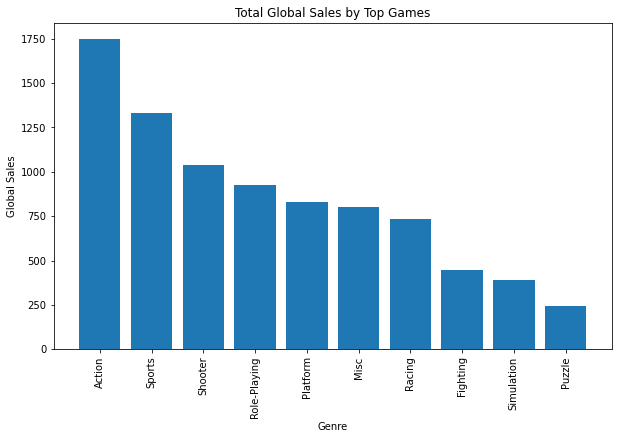

In [41]:
# create a bar chart using the genre_df DataFrame
plt.figure(figsize=(10,6))
plt.bar(genre_df.index[:10],genre_df['Global_Sales'].head(10))

# set the axis labels and title
plt.xlabel('Genre')
plt.ylabel('Global Sales')
plt.title('Total Global Sales by Top Games')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# show the plot
plt.show()

# ***7.Which year saw the greatest number of video game sales?***

In [42]:
freq_sales = df['Year'].value_counts().reset_index().rename(columns={'index': 'Year', 'Year': 'Name'})
freq_sales.head(1)

,Year,Name
0,2009.0,1431


***Visualization using plotly.graph_objs***

In [43]:
freq_sales = df['Year'].value_counts().reset_index()
# Create the traces
trace1 = go.Bar(y=freq_sales['Year'].head(10),x=freq_sales['index'].head(10),marker=dict(color=px.colors.qualitative.Pastel),text=freq_sales['Year'],textposition='inside',textfont=dict(size=14, color='black'))

# Combine the traces into a data list
data = [trace1]

# Set the layout
layout = go.Layout(title='Top 10 Years with the Highest Number of Video Game Sales',xaxis_title='Year', yaxis_title='Number of Video Games Released')

# Create a figure object that combines the data and layout
fig = go.Figure(data=data, layout=layout)

# Display the plot in the notebook
iplot(fig)

***Visualization using Matplotlib.pyplot***

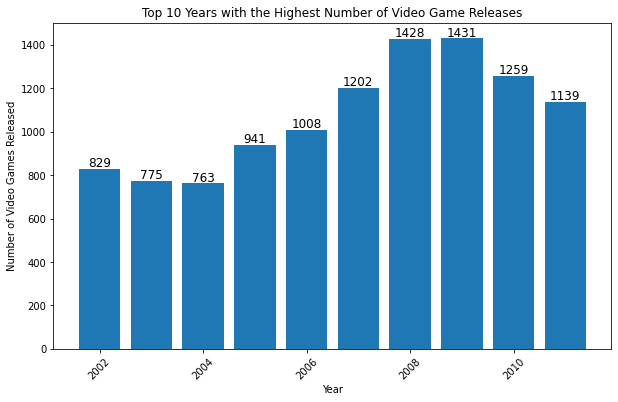

In [43]:
freq_sales = df['Year'].value_counts().reset_index()

plt.figure(figsize=(10,6))
plt.bar(freq_sales['index'].head(10), freq_sales['Year'].head(10))

# set the axis labels and title
plt.xlabel('Year')
plt.ylabel('Number of Video Games Released')
plt.title('Top 10 Years with the Highest Number of Video Game Releases')

# rotate the x-axis labels for better visibility
plt.xticks(rotation=45)

# add value labels to the bars
for i, v in enumerate(freq_sales['Year'].head(10)):
    plt.text(freq_sales['index'].head(10)[i], v+10, str(v), fontsize=12, color='black', ha='center')

# show the plot
plt.show()

# ***CONCLUSION***
Both matplotlib.pyplot and plotly.graph_objs are powerful and widely used Python visualization libraries, but they have some differences that make them suitable for different use cases.

matplotlib.pyplot is a popular 2D plotting library that provides a wide range of options for creating static visualizations such as line plots, scatter plots, bar charts, histograms, and more. It is easy to use and can be integrated into many Python applications. Matplotlib is a good choice if you want to quickly create publication-quality visualizations or to integrate plots into a Python application.

On the other hand, plotly.graph_objs is a powerful visualization library that is optimized for creating interactive, web-based visualizations. It provides a range of high-level chart types such as scatter plots, line charts, and bar charts, as well as more complex visualizations such as 3D plots and heatmaps. One of the key benefits of plotly is that it allows you to create interactive visualizations that can be easily embedded in web pages or Jupyter notebooks.




***In summary, if you want to create static visualizations quickly and easily, matplotlib.pyplot is a good choice. However, if you need to create interactive visualizations that can be easily shared on the web, plotly.graph_objs is a better choice.***